In [539]:
# Import dependencies
from matplotlib import pyplot as plt
from scipy.stats import linregress
import numpy as np
from sklearn import datasets
import pandas as pd
import seaborn as sns
import plotly.express as px
from pandas.plotting import scatter_matrix
import pgeocode




In [540]:
# Import the data from the CSV file
mls_df = pd.read_csv("Clean_Data/mls_cleaned.csv")
mls_df.head()

,MLS #,Property Type,City,Zip,Bedrooms,Total Baths,SqFt,Acres,Year Built,List Date,Closing Date,List Price,Sold Price,Days on Market,Over Asking,Lat,Lon
0,2372641,Single Family Residence,Raleigh,27607,5,8,9376,2,2022,2021-03-16,2022-02-23,1850000,324999,344,-1525001,35.8014,-78.6877
1,2410217,Single Family Residence,Whitsett,27377,5,7,6983,8,1883,2021-09-27,2023-01-09,1300000,3240000,469,1940000,36.0330,-79.5972
2,2375877,Single Family Residence,Wake Forest,27587,5,5,7200,7,2005,2021-04-05,2021-05-27,1800000,2900000,52,1100000,35.9815,-78.5392
3,2378933,Single Family Residence,Raleigh,27615,5,7,6289,3,2022,2021-04-20,2022-09-28,2550000,3577591,526,1027591,35.8887,-78.6393
4,2495996,Single Family Residence,Apex,27502,4,6,7266,5,2023,2023-02-21,2023-11-21,1755900,2598548,273,842648,35.7225,-78.8408


In [541]:
# Copy the data frame to a new data frame
sfr_df = mls_df.copy()

# Keep only the 'Single Family Residence' values in column 'Property Type'
sfr_df = sfr_df[sfr_df['Property Type'] == 'Single Family Residence']

# Drop the 'Property Type' column
sfr_df = sfr_df.drop(columns=['Property Type'])


sfr_df.head()

,MLS #,City,Zip,Bedrooms,Total Baths,SqFt,Acres,Year Built,List Date,Closing Date,List Price,Sold Price,Days on Market,Over Asking,Lat,Lon
0,2372641,Raleigh,27607,5,8,9376,2,2022,2021-03-16,2022-02-23,1850000,324999,344,-1525001,35.8014,-78.6877
1,2410217,Whitsett,27377,5,7,6983,8,1883,2021-09-27,2023-01-09,1300000,3240000,469,1940000,36.0330,-79.5972
2,2375877,Wake Forest,27587,5,5,7200,7,2005,2021-04-05,2021-05-27,1800000,2900000,52,1100000,35.9815,-78.5392
3,2378933,Raleigh,27615,5,7,6289,3,2022,2021-04-20,2022-09-28,2550000,3577591,526,1027591,35.8887,-78.6393
4,2495996,Apex,27502,4,6,7266,5,2023,2023-02-21,2023-11-21,1755900,2598548,273,842648,35.7225,-78.8408


In [542]:
sfr_df.describe()

,Zip,Bedrooms,Total Baths,SqFt,Acres,Year Built,List Price,Sold Price,Days on Market,Over Asking,Lat,Lon
count,112591.000000,112591.000000,112591.000000,112591.000000,112591.000000,112591.000000,1.125910e+05,1.125910e+05,112591.000000,1.125910e+05,112591.000000,112591.000000
mean,27576.588164,3.521472,2.901928,2324.042526,2.340045,2000.213934,4.656483e+05,4.714724e+05,89.306890,5.824103e+03,35.799332,-78.712250
std,297.678181,0.849454,1.024572,1002.336249,1.549254,134.778047,2.971473e+05,2.949881e+05,86.620829,3.646543e+04,0.252848,0.364554
min,17502.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000e+04,3.450000e+02,0.000000,-1.995000e+06,30.628500,-101.238700
25%,27520.000000,3.000000,2.000000,1600.000000,1.000000,1988.000000,3.000000e+05,3.060000e+05,38.000000,-4.500000e+03,35.634800,-78.887000
50%,27559.000000,3.000000,3.000000,2175.000000,2.000000,2006.000000,3.990000e+05,4.014000e+05,56.000000,0.000000e+00,35.807200,-78.687700
75%,27610.000000,4.000000,3.000000,2824.000000,3.000000,2021.000000,5.499000e+05,5.552820e+05,109.000000,1.300000e+04,35.978100,-78.489800
max,77332.000000,44.000000,34.000000,20283.000000,8.000000,20223.000000,7.000000e+06,6.625000e+06,1821.000000,1.940000e+06,43.886000,-75.467900


In [543]:
sfr_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 112591 entries, 0 to 141330
Data columns (total 16 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   MLS #           112591 non-null  object 
 1   City            112591 non-null  object 
 2   Zip             112591 non-null  int64  
 3   Bedrooms        112591 non-null  int64  
 4   Total Baths     112591 non-null  int64  
 5   SqFt            112591 non-null  int64  
 6   Acres           112591 non-null  int64  
 7   Year Built      112591 non-null  int64  
 8   List Date       112591 non-null  object 
 9   Closing Date    112591 non-null  object 
 10  List Price      112591 non-null  int64  
 11  Sold Price      112591 non-null  int64  
 12  Days on Market  112591 non-null  int64  
 13  Over Asking     112591 non-null  int64  
 14  Lat             112591 non-null  float64
 15  Lon             112591 non-null  float64
dtypes: float64(2), int64(10), object(4)
memory usage: 14.6+ MB


In [544]:
#Create a copy of the data frame and drop the non-numeric columns
sfr_nostr_df = sfr_df.copy()
sfr_nostr_df = sfr_nostr_df.drop(columns=['City'])
sfr_nostr_df = sfr_nostr_df.drop(columns=['List Date'])
sfr_nostr_df = sfr_nostr_df.drop(columns=['Closing Date'])
sfr_nostr_df = sfr_nostr_df.drop(columns=['MLS #'])

#Create a correlation matrix
corr_matrix = sfr_nostr_df.corr()
corr_matrix["Sold Price"].sort_values(ascending=False)

Sold Price        1.000000
List Price        0.992442
SqFt              0.770496
Total Baths       0.685001
Bedrooms          0.452093
Acres             0.131841
Days on Market    0.131765
Lat               0.076120
Year Built        0.038265
Over Asking       0.002378
Zip              -0.054264
Lon              -0.111288
Name: Sold Price, dtype: float64

array([[<Axes: xlabel='Sold Price', ylabel='Sold Price'>,
        <Axes: xlabel='SqFt', ylabel='Sold Price'>,
        <Axes: xlabel='Total Baths', ylabel='Sold Price'>,
        <Axes: xlabel='Bedrooms', ylabel='Sold Price'>,
        <Axes: xlabel='Lat', ylabel='Sold Price'>,
        <Axes: xlabel='Lon', ylabel='Sold Price'>],
       [<Axes: xlabel='Sold Price', ylabel='SqFt'>,
        <Axes: xlabel='SqFt', ylabel='SqFt'>,
        <Axes: xlabel='Total Baths', ylabel='SqFt'>,
        <Axes: xlabel='Bedrooms', ylabel='SqFt'>,
        <Axes: xlabel='Lat', ylabel='SqFt'>,
        <Axes: xlabel='Lon', ylabel='SqFt'>],
       [<Axes: xlabel='Sold Price', ylabel='Total Baths'>,
        <Axes: xlabel='SqFt', ylabel='Total Baths'>,
        <Axes: xlabel='Total Baths', ylabel='Total Baths'>,
        <Axes: xlabel='Bedrooms', ylabel='Total Baths'>,
        <Axes: xlabel='Lat', ylabel='Total Baths'>,
        <Axes: xlabel='Lon', ylabel='Total Baths'>],
       [<Axes: xlabel='Sold Price', ylabel='Be

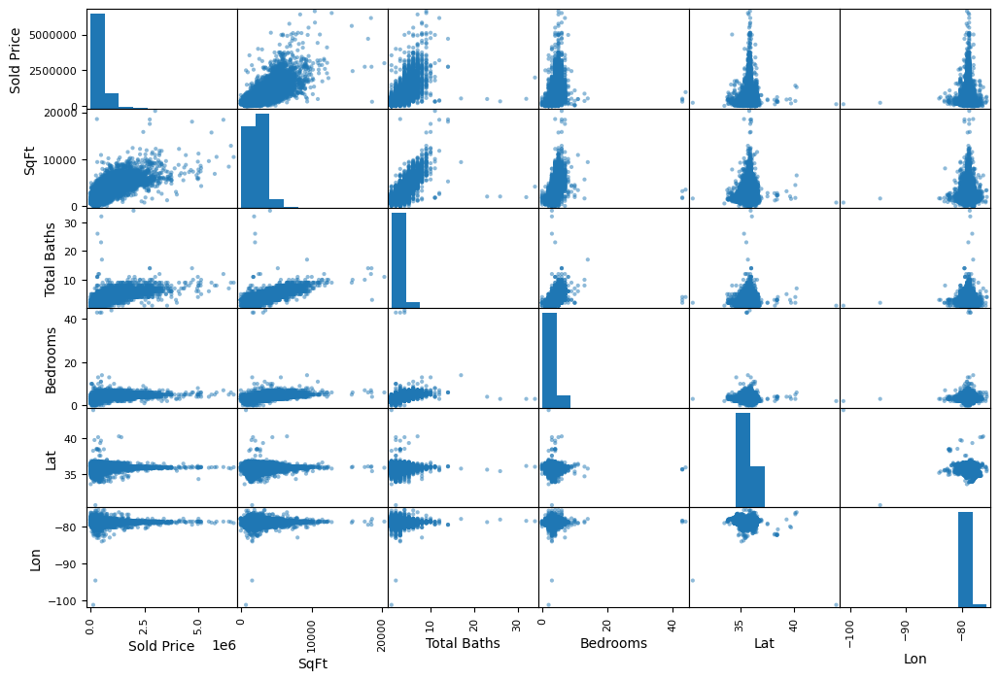

In [545]:
#Visualize the scatter matrix
scatter_columns = ["Sold Price", "SqFt", "Total Baths", "Bedrooms", 'Lat', 'Lon']
scatter_matrix(sfr_nostr_df[scatter_columns], figsize=(12, 8))
#plt.savefig('matrix.png')

<Axes: xlabel='SqFt', ylabel='Sold Price'>

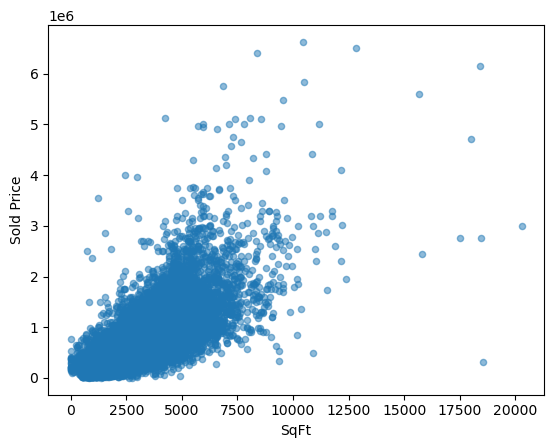

In [546]:
#Visualize the scatter plot for Total Living Area SqFt vs Sold Price
sfr_nostr_df.plot(kind="scatter", x="SqFt", y="Sold Price", alpha=0.5)
#plt.savefig('scatter.png')

In [547]:
#Create a new column for the price per square foot
sfr_nostr_df['Price per SqFt'] = sfr_nostr_df['Sold Price'] / sfr_nostr_df['SqFt']

#Create a correlation matrix to see what the correlation is for Price per SqFt
corr_matrix = sfr_nostr_df.corr()
corr_matrix["Sold Price"].sort_values(ascending=False)

Sold Price        1.000000
List Price        0.992442
SqFt              0.770496
Total Baths       0.685001
Bedrooms          0.452093
Acres             0.131841
Days on Market    0.131765
Lat               0.076120
Year Built        0.038265
Price per SqFt    0.007465
Over Asking       0.002378
Zip              -0.054264
Lon              -0.111288
Name: Sold Price, dtype: float64

In [548]:
#Check the orginal data frame to see how many cities are in the data
len(sfr_df['City'].value_counts())

373

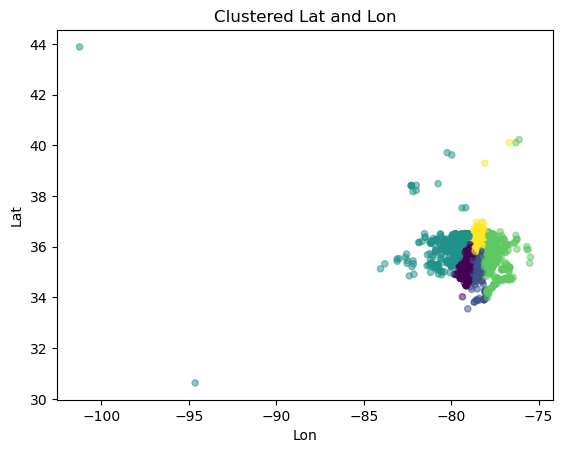

In [549]:
#Cluster the Lat and  Lon into groups
from sklearn.cluster import KMeans
sfr_df['Cluster'] = KMeans(n_clusters=5).fit_predict(sfr_df[['Lat', 'Lon']])
sfr_df.plot(kind="scatter", x="Lon", y="Lat", c="Cluster", cmap='viridis', colorbar=False, alpha=0.5)
plt.title('Clustered Lat and Lon')
plt.savefig('clustered.png')


In [550]:
#Create a variable for the top 10 cities with the highest average sold price
top10 = sfr_df.groupby('City')['Sold Price'].mean().nlargest(373).reset_index()

#Plot the top 10 cities with the highest average sold price
fig = px.bar(top10, x='City', y='Sold Price',color='City', template='plotly',
             title='Cities with Highest Avg. Sold Price') 
fig.update_traces(textposition='outside')
fig.show()

In [551]:
top10 = sfr_df.groupby('City')['Total Baths'].mean().nlargest(10).reset_index()

fig = px.bar(top10, x='City', y='Total Baths',color='Total Baths', template='plotly', 
             title='Top 10 Cities with the Most Avg Total Baths')
fig.update_traces(texttemplate='%{y:.}', textposition='outside')
fig.show()

In [552]:
df_mean = sfr_df.groupby('Over Asking')['SqFt'].mean().reset_index()

fig = px.scatter(df_mean, x='Over Asking', y='SqFt', trendline='ols', 
                 labels={'Over Asking':'Over Asking', 'SqFt':'Mean House Size'})
fig.update_layout(title='Distribution of Mean House Size by Over Asking')
fig.show()

In [553]:
fig = px.scatter(sfr_df, x='SqFt', y='Over Asking', color='Bedrooms', size='Total Baths',trendline='ols')
fig.update_layout(title='House Size vs Over Asking',
                  xaxis_title='House Size',
                  yaxis_title='Over Asking')
fig.show()

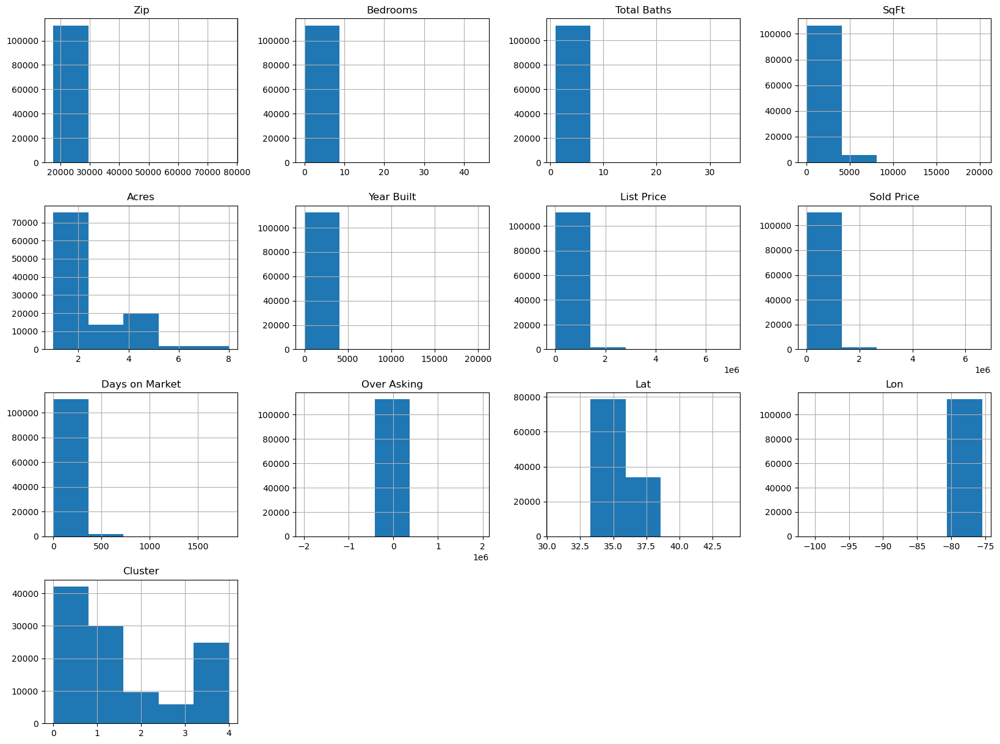

In [554]:
sfr_df.hist(bins=5, figsize=(20,15))
#plt.savefig("attribute_histogram_plots")
plt.show()

In [555]:
sfr_df.head()

,MLS #,City,Zip,Bedrooms,Total Baths,SqFt,Acres,Year Built,List Date,Closing Date,List Price,Sold Price,Days on Market,Over Asking,Lat,Lon,Cluster
0,2372641,Raleigh,27607,5,8,9376,2,2022,2021-03-16,2022-02-23,1850000,324999,344,-1525001,35.8014,-78.6877,0
1,2410217,Whitsett,27377,5,7,6983,8,1883,2021-09-27,2023-01-09,1300000,3240000,469,1940000,36.0330,-79.5972,2
2,2375877,Wake Forest,27587,5,5,7200,7,2005,2021-04-05,2021-05-27,1800000,2900000,52,1100000,35.9815,-78.5392,4
3,2378933,Raleigh,27615,5,7,6289,3,2022,2021-04-20,2022-09-28,2550000,3577591,526,1027591,35.8887,-78.6393,4
4,2495996,Apex,27502,4,6,7266,5,2023,2023-02-21,2023-11-21,1755900,2598548,273,842648,35.7225,-78.8408,0


In [556]:
# Variable with the Longitude and Latitude
X=sfr_df.loc[:,['MLS #','Lat','Lon']]
X.head(10)

,MLS #,Lat,Lon
0,2372641,35.8014,-78.6877
1,2410217,36.0330,-79.5972
2,2375877,35.9815,-78.5392
3,2378933,35.8887,-78.6393
4,2495996,35.7225,-78.8408
5,2293916,35.7641,-78.7786
6,2448408,35.8480,-78.6317
7,2508624,35.7667,-78.6008
8,2428206,35.7225,-78.8408
9,2437975,35.9631,-78.9315


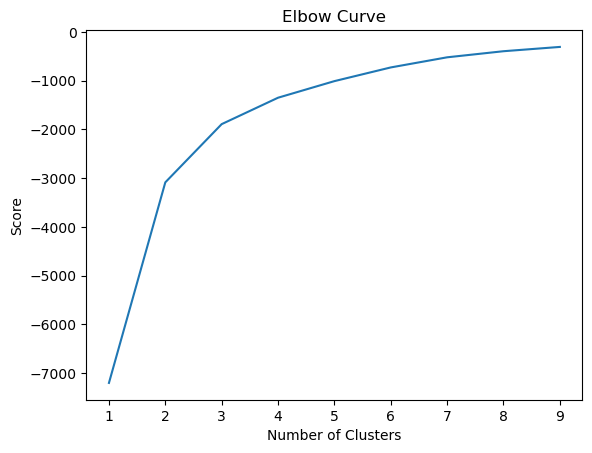

In [557]:
K_clusters = range(1,10)
kmeans = [KMeans(n_clusters=i) for i in K_clusters]
Y_axis = sfr_df[['Lat']]
X_axis = sfr_df[['Lon']]
score = [kmeans[i].fit(Y_axis).score(Y_axis) for i in range(len(kmeans))]
# Visualize
plt.plot(K_clusters, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [558]:
kmeans = KMeans(n_clusters = 4, init ='k-means++')
kmeans.fit(X[X.columns[1:3]]) # Compute k-means clustering.
X['cluster_label'] = kmeans.fit_predict(X[X.columns[1:3]])
centers = kmeans.cluster_centers_ # Coordinates of cluster centers.
labels = kmeans.predict(X[X.columns[1:3]]) # Labels of each point
X.head(10)

,MLS #,Lat,Lon,cluster_label
0,2372641,35.8014,-78.6877,3
1,2410217,36.0330,-79.5972,0
2,2375877,35.9815,-78.5392,3
3,2378933,35.8887,-78.6393,3
4,2495996,35.7225,-78.8408,1
5,2293916,35.7641,-78.7786,1
6,2448408,35.8480,-78.6317,3
7,2508624,35.7667,-78.6008,3
8,2428206,35.7225,-78.8408,1
9,2437975,35.9631,-78.9315,0


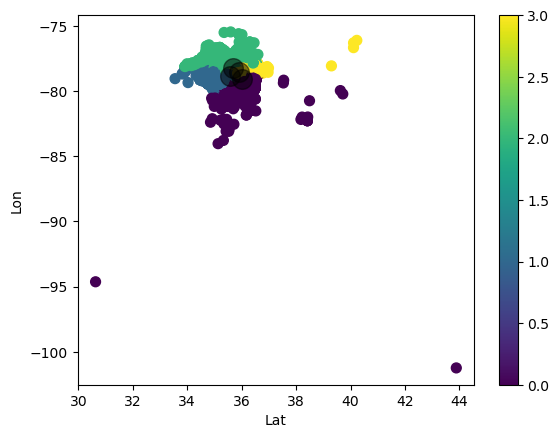

In [559]:
X.plot.scatter(x = 'Lat', y = 'Lon', c=labels, s=50, cmap='viridis')
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5)

<Axes: xlabel='SqFt'>

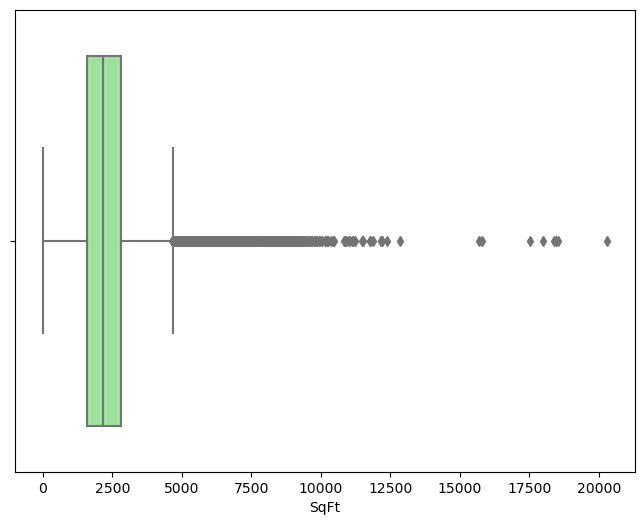

In [560]:
#Visualize the distribution of each numerical feature using box plots. Points beyond the “whiskers” of the box plot can be considered potential outliers.  
plt.figure(figsize=(8, 6)) 
sns.boxplot(x=sfr_df['SqFt'], color='lightgreen')

<Axes: xlabel='Bedrooms'>

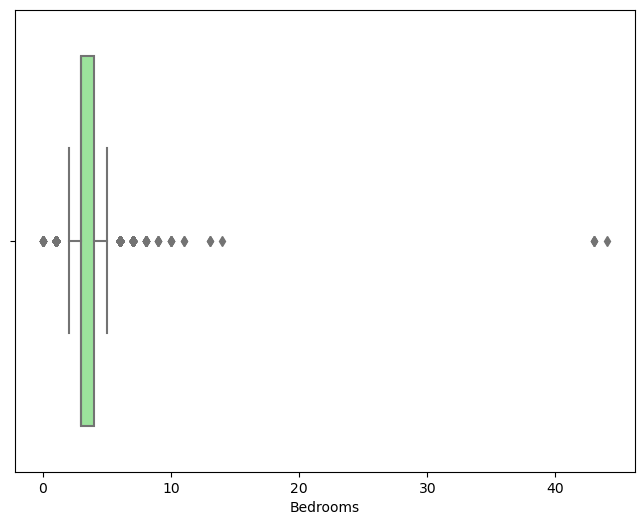

In [561]:
plt.figure(figsize=(8, 6)) 
sns.boxplot(x=sfr_df['Bedrooms'], color='lightgreen')

<Axes: xlabel='Total Baths'>

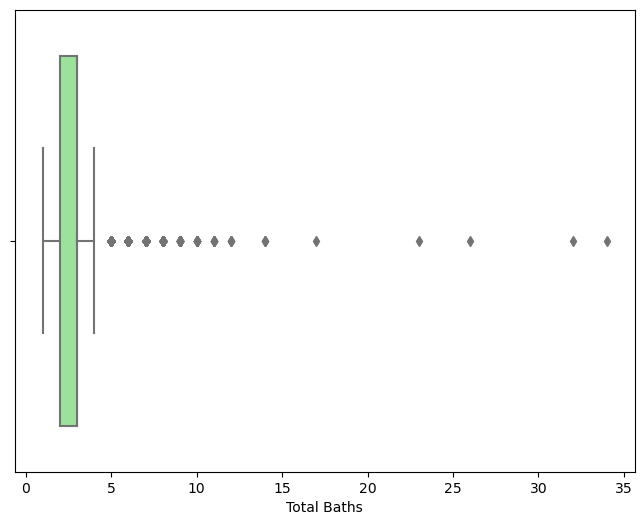

In [562]:
plt.figure(figsize=(8, 6)) 
sns.boxplot(x=sfr_df['Total Baths'], color='lightgreen')

<Axes: xlabel='Acres'>

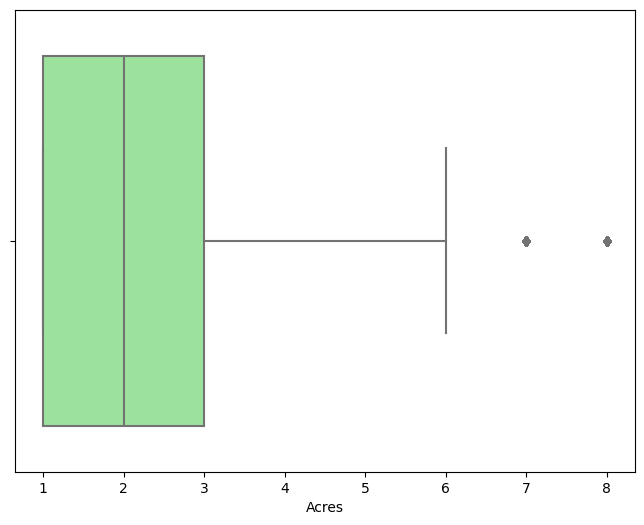

In [563]:
plt.figure(figsize=(8, 6)) 
sns.boxplot(x=sfr_df['Acres'], color='lightgreen')

<Axes: xlabel='Days on Market'>

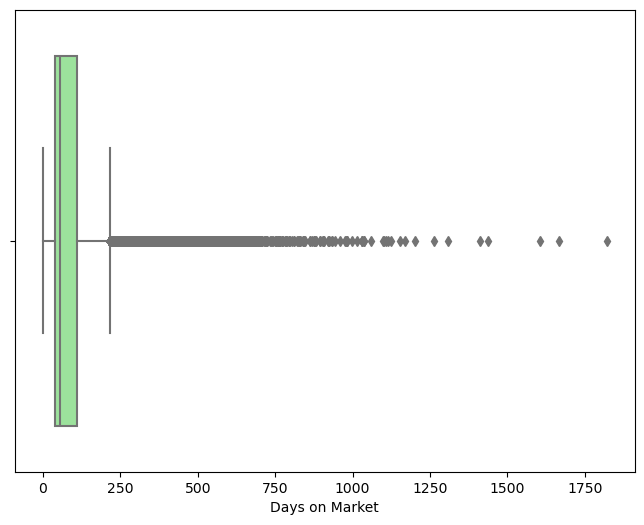

In [564]:
plt.figure(figsize=(8, 6)) 
sns.boxplot(x=sfr_df['Days on Market'], color='lightgreen')

<Axes: xlabel='Year Built'>

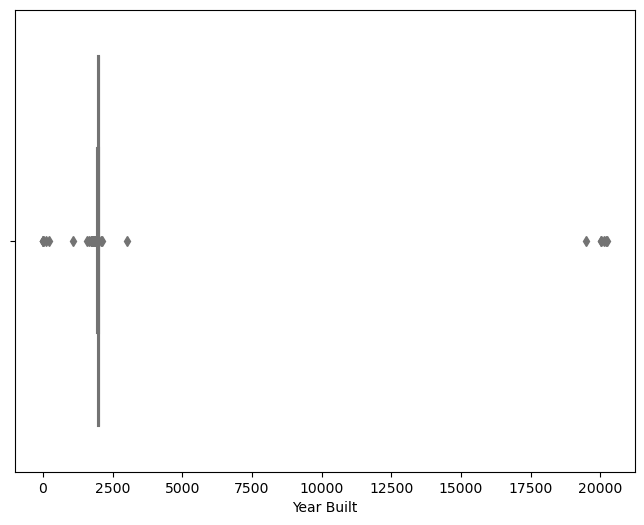

In [565]:
plt.figure(figsize=(8, 6)) 
sns.boxplot(x=sfr_df['Year Built'], color='lightgreen')

In [566]:
#Find the row with the value of 44 in the 'Bedrooms' column
sfr_df.loc[sfr_df['Bedrooms'] == 44]

#Drop the row with the value of 44 in the 'Bedrooms' column
sfr_df = sfr_df[sfr_df['Bedrooms'] != 44]


In [567]:
#Find the row with the most 'Total Baths'
max_idx = sfr_df['Bedrooms'].idxmax()
row_with_max_total_baths = sfr_df.loc[max_idx]

row_with_max_total_baths

MLS #                   2464416
City              Fuquay Varina
Zip                       27526
Bedrooms                     43
Total Baths                   2
SqFt                       1821
Acres                         1
Year Built                 2022
List Date            2022-01-14
Closing Date         2022-08-22
List Price               453295
Sold Price               453295
Days on Market              220
Over Asking                   0
Lat                       35.58
Lon                    -78.7908
Cluster                       0
Name: 92126, dtype: object

In [568]:
#Drop the row with the value of 44 in the 'Bedrooms' column
sfr_df = sfr_df[sfr_df['Bedrooms'] != 43]
sfr_df = sfr_df[sfr_df['Bedrooms'] != 0]


In [569]:
#Find the row with the most 'Total Baths'
max_idx = sfr_df['Bedrooms'].idxmax()
row_with_max_total_baths = sfr_df.loc[max_idx]

row_with_max_total_baths

MLS #                2209749
City                  Wilson
Zip                    27893
Bedrooms                  14
Total Baths               17
SqFt                    9355
Acres                      5
Year Built              1858
List Date         2018-08-15
Closing Date      2021-09-02
List Price            610000
Sold Price            540500
Days on Market          1114
Over Asking           -69500
Lat                   35.727
Lon                 -77.9227
Cluster                    3
Name: 139814, dtype: object

In [570]:
#Find the row with the most 'Total Baths'
max_idx = sfr_df['Total Baths'].idxmax()
row_with_max_total_baths = sfr_df.loc[max_idx]

row_with_max_total_baths

MLS #                 2507027
City              Wake Forest
Zip                     27587
Bedrooms                    3
Total Baths                34
SqFt                     4122
Acres                       4
Year Built               2023
List Date          2023-04-25
Closing Date       2023-05-10
List Price            2000000
Sold Price            2000000
Days on Market             15
Over Asking                 0
Lat                   35.9815
Lon                  -78.5392
Cluster                     4
Name: 90959, dtype: object

In [571]:
#Drop the row with the value of 34 in the 'Total Baths' column
sfr_df = sfr_df[sfr_df['Total Baths'] != 34]
sfr_df = sfr_df[sfr_df['Total Baths'] != 0]

In [572]:
#Find the row with the most 'Total Baths'
max_idx = sfr_df['Total Baths'].idxmax()
row_with_max_total_baths = sfr_df.loc[max_idx]

row_with_max_total_baths

MLS #                 2395006
City              Franklinton
Zip                     27525
Bedrooms                    3
Total Baths                32
SqFt                     1874
Acres                       5
Year Built               2021
List Date          2021-07-06
Closing Date       2021-10-18
List Price             515000
Sold Price             515000
Days on Market            104
Over Asking                 0
Lat                   36.0955
Lon                  -78.4486
Cluster                     4
Name: 63964, dtype: object

In [573]:
#Drop the row with the value of 34 in the 'Total Baths' column
sfr_df = sfr_df[sfr_df['Total Baths'] != 32]


In [574]:
#Find the row with the most 'Total Baths'
max_idx = sfr_df['Total Baths'].idxmax()
row_with_max_total_baths = sfr_df.loc[max_idx]

row_with_max_total_baths

MLS #                2503456
City               Goldsboro
Zip                    27530
Bedrooms                   3
Total Baths               26
SqFt                    2015
Acres                      2
Year Built              2022
List Date         2023-04-05
Closing Date      2023-05-23
List Price            338000
Sold Price            338000
Days on Market            48
Over Asking                0
Lat                  35.3683
Lon                 -78.0929
Cluster                    3
Name: 86712, dtype: object

In [575]:
#Drop the row with the value of 26 in the 'Total Baths' column
sfr_df = sfr_df[sfr_df['Total Baths'] != 26]

In [576]:
#Find the row with the most 'Total Baths'
max_idx = sfr_df['Total Baths'].idxmax()
row_with_max_total_baths = sfr_df.loc[max_idx]

row_with_max_total_baths

MLS #                   2453590
City              Fuquay Varina
Zip                       27526
Bedrooms                      4
Total Baths                  23
SqFt                       2005
Acres                         2
Year Built                 2022
List Date            2022-06-03
Closing Date         2022-08-26
List Price               491000
Sold Price               501200
Days on Market               84
Over Asking               10200
Lat                       35.58
Lon                    -78.7908
Cluster                       0
Name: 36408, dtype: object

In [577]:
#Drop the row with the value of 26 in the 'Total Baths' column
sfr_df = sfr_df[sfr_df['Total Baths'] != 23]

In [578]:
#Find the row with the most 'Total Baths'
max_idx = sfr_df['Total Baths'].idxmax()
row_with_max_total_baths = sfr_df.loc[max_idx]

row_with_max_total_baths

MLS #                2209749
City                  Wilson
Zip                    27893
Bedrooms                  14
Total Baths               17
SqFt                    9355
Acres                      5
Year Built              1858
List Date         2018-08-15
Closing Date      2021-09-02
List Price            610000
Sold Price            540500
Days on Market          1114
Over Asking           -69500
Lat                   35.727
Lon                 -77.9227
Cluster                    3
Name: 139814, dtype: object

In [579]:
#Find the row with the most 'Total Baths'
max_idx = sfr_df['Year Built'].idxmax()
row_with_max_total_baths = sfr_df.loc[max_idx]

row_with_max_total_baths

MLS #                 LP722970
City              Fayetteville
Zip                      28306
Bedrooms                     4
Total Baths                  3
SqFt                      2685
Acres                        3
Year Built               20223
List Date           2024-04-16
Closing Date        2024-06-14
List Price              497900
Sold Price              485000
Days on Market              59
Over Asking             -12900
Lat                    35.0019
Lon                   -78.9364
Cluster                      0
Name: 124073, dtype: object

In [580]:
sfr_df.sort_values('Year Built', ascending=True)

,MLS #,City,Zip,Bedrooms,Total Baths,SqFt,Acres,Year Built,List Date,Closing Date,List Price,Sold Price,Days on Market,Over Asking,Lat,Lon,Cluster
42774,2380815,Four Oaks,27524,4,3,2348,3,0,2021-04-29,2022-05-25,351785,358951,391,7166,35.4040,-78.4153,1
21477,2437279,Durham,27701,2,2,948,1,0,2022-03-18,2022-05-16,225000,250000,59,25000,35.9967,-78.8966,0
32437,2447275,Raleigh,27609,4,3,2041,2,1,2022-05-06,2022-06-08,485000,500000,33,15000,35.8480,-78.6317,4
30402,2426477,Zebulon,27597,3,2,1479,3,3,2022-01-11,2022-03-01,310000,325000,49,15000,35.8321,-78.3174,1
2389,2435799,Garner,27529,4,3,2845,2,97,2022-03-10,2022-03-31,414000,502000,21,88000,35.6813,-78.5975,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48903,2374916,Garner,27529,3,2,1316,1,20006,2021-03-30,2021-05-07,220000,225000,38,5000,35.6813,-78.5975,1
22348,2495929,Apex,27523,5,6,4172,2,20023,2023-02-20,2023-09-08,1147570,1170706,200,23136,35.7225,-78.8408,0
41770,2413222,Wake Forest,27587,4,4,2689,2,20116,2021-10-12,2021-12-08,499500,507500,57,8000,35.9815,-78.5392,4
74081,2366184,Wilson,27883,4,2,1795,5,20211,2021-02-11,2021-06-30,233990,233990,139,0,35.5940,-77.8378,3


In [581]:
sfr_df = sfr_df[sfr_df['Year Built'] != 0]
sfr_df = sfr_df[sfr_df['Year Built'] != 1]
sfr_df = sfr_df[sfr_df['Year Built'] != 3]
sfr_df = sfr_df[sfr_df['Year Built'] != 97]
sfr_df = sfr_df[sfr_df['Year Built'] != 202]

sfr_df.sort_values('Year Built', ascending=True)

,MLS #,City,Zip,Bedrooms,Total Baths,SqFt,Acres,Year Built,List Date,Closing Date,List Price,Sold Price,Days on Market,Over Asking,Lat,Lon,Cluster
42658,2392576,Four Oaks,27524,3,2,1722,5,1073,2021-06-28,2021-08-10,242500,250000,43,7500,35.4040,-78.4153,1
80965,2497663,Durham,27707,3,1,1138,1,1577,2023-02-06,2023-02-28,300000,300000,22,0,35.9631,-78.9315,0
19713,2407870,Chapel Hill,27514,2,1,880,2,1647,2021-09-15,2021-10-06,284900,310000,21,25100,35.9203,-79.0372,0
133545,2436650,Mebane,27302,3,2,2099,5,1721,2022-03-16,2022-07-12,374900,350000,118,-24900,36.0979,-79.2719,2
139015,2355892,Hillsborough,27278,6,6,6945,7,1750,2020-12-02,2021-06-11,1050000,1000000,191,-50000,36.0756,-79.0914,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48903,2374916,Garner,27529,3,2,1316,1,20006,2021-03-30,2021-05-07,220000,225000,38,5000,35.6813,-78.5975,1
22348,2495929,Apex,27523,5,6,4172,2,20023,2023-02-20,2023-09-08,1147570,1170706,200,23136,35.7225,-78.8408,0
41770,2413222,Wake Forest,27587,4,4,2689,2,20116,2021-10-12,2021-12-08,499500,507500,57,8000,35.9815,-78.5392,4
74081,2366184,Wilson,27883,4,2,1795,5,20211,2021-02-11,2021-06-30,233990,233990,139,0,35.5940,-77.8378,3


In [582]:
sfr_df.sort_values('Year Built', ascending=False)

,MLS #,City,Zip,Bedrooms,Total Baths,SqFt,Acres,Year Built,List Date,Closing Date,List Price,Sold Price,Days on Market,Over Asking,Lat,Lon,Cluster
124073,LP722970,Fayetteville,28306,4,3,2685,3,20223,2024-04-16,2024-06-14,497900,485000,59,-12900,35.0019,-78.9364,0
74081,2366184,Wilson,27883,4,2,1795,5,20211,2021-02-11,2021-06-30,233990,233990,139,0,35.5940,-77.8378,3
41770,2413222,Wake Forest,27587,4,4,2689,2,20116,2021-10-12,2021-12-08,499500,507500,57,8000,35.9815,-78.5392,4
22348,2495929,Apex,27523,5,6,4172,2,20023,2023-02-20,2023-09-08,1147570,1170706,200,23136,35.7225,-78.8408,0
48903,2374916,Garner,27529,3,2,1316,1,20006,2021-03-30,2021-05-07,220000,225000,38,5000,35.6813,-78.5975,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139015,2355892,Hillsborough,27278,6,6,6945,7,1750,2020-12-02,2021-06-11,1050000,1000000,191,-50000,36.0756,-79.0914,2
133545,2436650,Mebane,27302,3,2,2099,5,1721,2022-03-16,2022-07-12,374900,350000,118,-24900,36.0979,-79.2719,2
19713,2407870,Chapel Hill,27514,2,1,880,2,1647,2021-09-15,2021-10-06,284900,310000,21,25100,35.9203,-79.0372,0
80965,2497663,Durham,27707,3,1,1138,1,1577,2023-02-06,2023-02-28,300000,300000,22,0,35.9631,-78.9315,0


In [583]:
# Edit the first occurrence of '3837737' in the 'List Price' column to '383737'
index = (sfr_df['Year Built'] == 20223).idxmax()
sfr_df.loc[index, 'Year Built'] = 2023

In [584]:
sfr_df.sort_values('Year Built', ascending=False)

,MLS #,City,Zip,Bedrooms,Total Baths,SqFt,Acres,Year Built,List Date,Closing Date,List Price,Sold Price,Days on Market,Over Asking,Lat,Lon,Cluster
74081,2366184,Wilson,27883,4,2,1795,5,20211,2021-02-11,2021-06-30,233990,233990,139,0,35.5940,-77.8378,3
41770,2413222,Wake Forest,27587,4,4,2689,2,20116,2021-10-12,2021-12-08,499500,507500,57,8000,35.9815,-78.5392,4
22348,2495929,Apex,27523,5,6,4172,2,20023,2023-02-20,2023-09-08,1147570,1170706,200,23136,35.7225,-78.8408,0
48903,2374916,Garner,27529,3,2,1316,1,20006,2021-03-30,2021-05-07,220000,225000,38,5000,35.6813,-78.5975,1
110842,2534062,Thomasville,27360,2,1,1279,5,19496,2023-09-25,2024-01-11,130000,125000,108,-5000,35.8713,-80.0913,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139015,2355892,Hillsborough,27278,6,6,6945,7,1750,2020-12-02,2021-06-11,1050000,1000000,191,-50000,36.0756,-79.0914,2
133545,2436650,Mebane,27302,3,2,2099,5,1721,2022-03-16,2022-07-12,374900,350000,118,-24900,36.0979,-79.2719,2
19713,2407870,Chapel Hill,27514,2,1,880,2,1647,2021-09-15,2021-10-06,284900,310000,21,25100,35.9203,-79.0372,0
80965,2497663,Durham,27707,3,1,1138,1,1577,2023-02-06,2023-02-28,300000,300000,22,0,35.9631,-78.9315,0


In [585]:
index = (sfr_df['Year Built'] == 20211).idxmax()
sfr_df.loc[index, 'Year Built'] = 2021

In [586]:
sfr_df.sort_values('Year Built', ascending=False)

,MLS #,City,Zip,Bedrooms,Total Baths,SqFt,Acres,Year Built,List Date,Closing Date,List Price,Sold Price,Days on Market,Over Asking,Lat,Lon,Cluster
41770,2413222,Wake Forest,27587,4,4,2689,2,20116,2021-10-12,2021-12-08,499500,507500,57,8000,35.9815,-78.5392,4
22348,2495929,Apex,27523,5,6,4172,2,20023,2023-02-20,2023-09-08,1147570,1170706,200,23136,35.7225,-78.8408,0
48903,2374916,Garner,27529,3,2,1316,1,20006,2021-03-30,2021-05-07,220000,225000,38,5000,35.6813,-78.5975,1
110842,2534062,Thomasville,27360,2,1,1279,5,19496,2023-09-25,2024-01-11,130000,125000,108,-5000,35.8713,-80.0913,2
79997,2505090,Benson,27504,3,2,2341,3,3023,2023-04-14,2023-05-18,439900,439900,34,0,35.4037,-78.5421,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139015,2355892,Hillsborough,27278,6,6,6945,7,1750,2020-12-02,2021-06-11,1050000,1000000,191,-50000,36.0756,-79.0914,2
133545,2436650,Mebane,27302,3,2,2099,5,1721,2022-03-16,2022-07-12,374900,350000,118,-24900,36.0979,-79.2719,2
19713,2407870,Chapel Hill,27514,2,1,880,2,1647,2021-09-15,2021-10-06,284900,310000,21,25100,35.9203,-79.0372,0
80965,2497663,Durham,27707,3,1,1138,1,1577,2023-02-06,2023-02-28,300000,300000,22,0,35.9631,-78.9315,0


In [587]:
index = (sfr_df['Year Built'] == 20116).idxmax()
sfr_df.loc[index, 'Year Built'] = 2016

In [588]:
sfr_df.sort_values('Year Built', ascending=False)

,MLS #,City,Zip,Bedrooms,Total Baths,SqFt,Acres,Year Built,List Date,Closing Date,List Price,Sold Price,Days on Market,Over Asking,Lat,Lon,Cluster
22348,2495929,Apex,27523,5,6,4172,2,20023,2023-02-20,2023-09-08,1147570,1170706,200,23136,35.7225,-78.8408,0
48903,2374916,Garner,27529,3,2,1316,1,20006,2021-03-30,2021-05-07,220000,225000,38,5000,35.6813,-78.5975,1
110842,2534062,Thomasville,27360,2,1,1279,5,19496,2023-09-25,2024-01-11,130000,125000,108,-5000,35.8713,-80.0913,2
79997,2505090,Benson,27504,3,2,2341,3,3023,2023-04-14,2023-05-18,439900,439900,34,0,35.4037,-78.5421,1
84147,2400898,Fuquay Varina,27526,2,2,1745,1,2121,2021-08-10,2022-11-30,432355,432355,477,0,35.5800,-78.7908,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139015,2355892,Hillsborough,27278,6,6,6945,7,1750,2020-12-02,2021-06-11,1050000,1000000,191,-50000,36.0756,-79.0914,2
133545,2436650,Mebane,27302,3,2,2099,5,1721,2022-03-16,2022-07-12,374900,350000,118,-24900,36.0979,-79.2719,2
19713,2407870,Chapel Hill,27514,2,1,880,2,1647,2021-09-15,2021-10-06,284900,310000,21,25100,35.9203,-79.0372,0
80965,2497663,Durham,27707,3,1,1138,1,1577,2023-02-06,2023-02-28,300000,300000,22,0,35.9631,-78.9315,0


In [589]:
index = (sfr_df['Year Built'] == 20023).idxmax()
sfr_df.loc[index, 'Year Built'] = 2023

In [590]:
sfr_df.sort_values('Year Built', ascending=False)

,MLS #,City,Zip,Bedrooms,Total Baths,SqFt,Acres,Year Built,List Date,Closing Date,List Price,Sold Price,Days on Market,Over Asking,Lat,Lon,Cluster
48903,2374916,Garner,27529,3,2,1316,1,20006,2021-03-30,2021-05-07,220000,225000,38,5000,35.6813,-78.5975,1
110842,2534062,Thomasville,27360,2,1,1279,5,19496,2023-09-25,2024-01-11,130000,125000,108,-5000,35.8713,-80.0913,2
79997,2505090,Benson,27504,3,2,2341,3,3023,2023-04-14,2023-05-18,439900,439900,34,0,35.4037,-78.5421,1
84147,2400898,Fuquay Varina,27526,2,2,1745,1,2121,2021-08-10,2022-11-30,432355,432355,477,0,35.5800,-78.7908,0
55874,2418794,Raleigh,27604,3,3,2083,1,2083,2021-11-12,2022-03-31,414630,415660,139,1030,35.8334,-78.5799,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139015,2355892,Hillsborough,27278,6,6,6945,7,1750,2020-12-02,2021-06-11,1050000,1000000,191,-50000,36.0756,-79.0914,2
133545,2436650,Mebane,27302,3,2,2099,5,1721,2022-03-16,2022-07-12,374900,350000,118,-24900,36.0979,-79.2719,2
19713,2407870,Chapel Hill,27514,2,1,880,2,1647,2021-09-15,2021-10-06,284900,310000,21,25100,35.9203,-79.0372,0
80965,2497663,Durham,27707,3,1,1138,1,1577,2023-02-06,2023-02-28,300000,300000,22,0,35.9631,-78.9315,0


In [591]:
index = (sfr_df['Year Built'] == 20006).idxmax()
sfr_df.loc[index, 'Year Built'] = 2006

In [592]:
sfr_df.sort_values('Year Built', ascending=False)


,MLS #,City,Zip,Bedrooms,Total Baths,SqFt,Acres,Year Built,List Date,Closing Date,List Price,Sold Price,Days on Market,Over Asking,Lat,Lon,Cluster
110842,2534062,Thomasville,27360,2,1,1279,5,19496,2023-09-25,2024-01-11,130000,125000,108,-5000,35.8713,-80.0913,2
79997,2505090,Benson,27504,3,2,2341,3,3023,2023-04-14,2023-05-18,439900,439900,34,0,35.4037,-78.5421,1
84147,2400898,Fuquay Varina,27526,2,2,1745,1,2121,2021-08-10,2022-11-30,432355,432355,477,0,35.5800,-78.7908,0
55874,2418794,Raleigh,27604,3,3,2083,1,2083,2021-11-12,2022-03-31,414630,415660,139,1030,35.8334,-78.5799,4
74068,10013413,Pittsboro,27312,4,6,4520,4,2025,2024-02-23,2024-04-11,1590000,1590000,48,0,35.7694,-79.1755,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139015,2355892,Hillsborough,27278,6,6,6945,7,1750,2020-12-02,2021-06-11,1050000,1000000,191,-50000,36.0756,-79.0914,2
133545,2436650,Mebane,27302,3,2,2099,5,1721,2022-03-16,2022-07-12,374900,350000,118,-24900,36.0979,-79.2719,2
19713,2407870,Chapel Hill,27514,2,1,880,2,1647,2021-09-15,2021-10-06,284900,310000,21,25100,35.9203,-79.0372,0
80965,2497663,Durham,27707,3,1,1138,1,1577,2023-02-06,2023-02-28,300000,300000,22,0,35.9631,-78.9315,0


In [593]:
index = (sfr_df['Year Built'] == 19496).idxmax()
sfr_df.loc[index, 'Year Built'] = 1949

In [594]:
sfr_df.sort_values('Year Built', ascending=False)


,MLS #,City,Zip,Bedrooms,Total Baths,SqFt,Acres,Year Built,List Date,Closing Date,List Price,Sold Price,Days on Market,Over Asking,Lat,Lon,Cluster
79997,2505090,Benson,27504,3,2,2341,3,3023,2023-04-14,2023-05-18,439900,439900,34,0,35.4037,-78.5421,1
84147,2400898,Fuquay Varina,27526,2,2,1745,1,2121,2021-08-10,2022-11-30,432355,432355,477,0,35.5800,-78.7908,0
55874,2418794,Raleigh,27604,3,3,2083,1,2083,2021-11-12,2022-03-31,414630,415660,139,1030,35.8334,-78.5799,4
93005,10012732,Pittsboro,27312,4,6,3604,4,2025,2024-02-20,2024-03-28,1454000,1454000,37,0,35.7694,-79.1755,0
74068,10013413,Pittsboro,27312,4,6,4520,4,2025,2024-02-23,2024-04-11,1590000,1590000,48,0,35.7694,-79.1755,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139015,2355892,Hillsborough,27278,6,6,6945,7,1750,2020-12-02,2021-06-11,1050000,1000000,191,-50000,36.0756,-79.0914,2
133545,2436650,Mebane,27302,3,2,2099,5,1721,2022-03-16,2022-07-12,374900,350000,118,-24900,36.0979,-79.2719,2
19713,2407870,Chapel Hill,27514,2,1,880,2,1647,2021-09-15,2021-10-06,284900,310000,21,25100,35.9203,-79.0372,0
80965,2497663,Durham,27707,3,1,1138,1,1577,2023-02-06,2023-02-28,300000,300000,22,0,35.9631,-78.9315,0


In [595]:
sfr_df = sfr_df[sfr_df['Year Built'] != 3023]
sfr_df = sfr_df[sfr_df['Year Built'] != 2083]
sfr_df = sfr_df[sfr_df['Year Built'] != 2121]



#Remove all the rows where the 'SqFt' is less than 100
sfr_df = sfr_df[sfr_df['SqFt'] > 199]

sfr_df.sort_values('Year Built', ascending=False)


,MLS #,City,Zip,Bedrooms,Total Baths,SqFt,Acres,Year Built,List Date,Closing Date,List Price,Sold Price,Days on Market,Over Asking,Lat,Lon,Cluster
74068,10013413,Pittsboro,27312,4,6,4520,4,2025,2024-02-23,2024-04-11,1590000,1590000,48,0,35.7694,-79.1755,0
93005,10012732,Pittsboro,27312,4,6,3604,4,2025,2024-02-20,2024-03-28,1454000,1454000,37,0,35.7694,-79.1755,0
89730,10014009,Louisburg,27549,4,3,2756,5,2024,2024-02-27,2024-02-27,744889,744889,0,0,36.0578,-78.2586,4
111889,10009632,Zebulon,27597,3,3,1924,1,2024,2024-02-02,2024-03-27,339645,334500,54,-5145,35.8321,-78.3174,1
111888,10012279,Zebulon,27597,3,3,1924,1,2024,2024-02-17,2024-03-28,349145,344000,40,-5145,35.8321,-78.3174,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139015,2355892,Hillsborough,27278,6,6,6945,7,1750,2020-12-02,2021-06-11,1050000,1000000,191,-50000,36.0756,-79.0914,2
133545,2436650,Mebane,27302,3,2,2099,5,1721,2022-03-16,2022-07-12,374900,350000,118,-24900,36.0979,-79.2719,2
19713,2407870,Chapel Hill,27514,2,1,880,2,1647,2021-09-15,2021-10-06,284900,310000,21,25100,35.9203,-79.0372,0
80965,2497663,Durham,27707,3,1,1138,1,1577,2023-02-06,2023-02-28,300000,300000,22,0,35.9631,-78.9315,0


In [596]:
sfr_df.sort_values('Year Built', ascending=True)


,MLS #,City,Zip,Bedrooms,Total Baths,SqFt,Acres,Year Built,List Date,Closing Date,List Price,Sold Price,Days on Market,Over Asking,Lat,Lon,Cluster
42658,2392576,Four Oaks,27524,3,2,1722,5,1073,2021-06-28,2021-08-10,242500,250000,43,7500,35.4040,-78.4153,1
80965,2497663,Durham,27707,3,1,1138,1,1577,2023-02-06,2023-02-28,300000,300000,22,0,35.9631,-78.9315,0
19713,2407870,Chapel Hill,27514,2,1,880,2,1647,2021-09-15,2021-10-06,284900,310000,21,25100,35.9203,-79.0372,0
133545,2436650,Mebane,27302,3,2,2099,5,1721,2022-03-16,2022-07-12,374900,350000,118,-24900,36.0979,-79.2719,2
139015,2355892,Hillsborough,27278,6,6,6945,7,1750,2020-12-02,2021-06-11,1050000,1000000,191,-50000,36.0756,-79.0914,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106435,10014019,Selma,27576,3,2,1319,1,2024,2024-02-28,2024-05-14,274500,270000,76,-4500,35.5565,-78.2640,1
106340,10010780,Goldsboro,27530,3,3,2231,2,2024,2024-02-09,2024-06-13,299330,295000,125,-4330,35.3683,-78.0929,3
72322,2538350,Willow Springs,27592,4,3,2669,3,2024,2023-10-20,2024-04-30,558135,558135,193,0,35.5470,-78.6717,1
74068,10013413,Pittsboro,27312,4,6,4520,4,2025,2024-02-23,2024-04-11,1590000,1590000,48,0,35.7694,-79.1755,0


In [597]:
sfr_df = sfr_df[sfr_df['Year Built'] != 1073]
sfr_df = sfr_df[sfr_df['Year Built'] != 1577]
sfr_df = sfr_df[sfr_df['Year Built'] != 1647]

In [598]:
sfr_df.sort_values('Year Built', ascending=False)


,MLS #,City,Zip,Bedrooms,Total Baths,SqFt,Acres,Year Built,List Date,Closing Date,List Price,Sold Price,Days on Market,Over Asking,Lat,Lon,Cluster
74068,10013413,Pittsboro,27312,4,6,4520,4,2025,2024-02-23,2024-04-11,1590000,1590000,48,0,35.7694,-79.1755,0
93005,10012732,Pittsboro,27312,4,6,3604,4,2025,2024-02-20,2024-03-28,1454000,1454000,37,0,35.7694,-79.1755,0
73955,10024593,Pittsboro,27312,3,3,2221,1,2024,2024-04-22,2024-04-22,596301,596301,0,0,35.7694,-79.1755,0
101140,10010992,Sanford,27332,4,3,1991,2,2024,2024-02-10,2024-06-10,339990,338990,121,-1000,35.4469,-79.1380,0
92232,10011868,Zebulon,27597,3,3,1510,4,2024,2024-02-15,2024-06-06,324900,324900,112,0,35.8321,-78.3174,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141211,2495819,Hillsborough,27278,3,3,2614,5,1768,2023-02-19,2023-04-11,1400000,1150000,51,-250000,36.0756,-79.0914,2
140204,2404610,Henderson,27536,4,4,4557,8,1760,2021-08-28,2022-06-10,900000,820000,286,-80000,36.3301,-78.3981,4
141012,2363488,Hillsborough,27278,5,6,6599,7,1757,2021-01-26,2022-05-10,2350000,2200000,469,-150000,36.0756,-79.0914,2
139015,2355892,Hillsborough,27278,6,6,6945,7,1750,2020-12-02,2021-06-11,1050000,1000000,191,-50000,36.0756,-79.0914,2


In [599]:
# Save the DataFrame to a CSV file
sfr_df.to_csv('Clean_Data/mls_sfr_cleaned.csv', index=False)

In [603]:
sfr_df.sort_values('Zip', ascending=False)


,MLS #,City,Zip,Bedrooms,Total Baths,SqFt,Acres,Year Built,List Date,Closing Date,List Price,Sold Price,Days on Market,Over Asking,Lat,Lon,Cluster
32071,2385737,Sanford,77332,3,2,1592,1,2008,2021-05-25,2021-06-28,225000,240000,34,15000,30.6285,-94.6319,2
95081,2428490,Coats,57521,2,1,720,1,1940,2022-01-26,2022-02-25,139900,139900,30,0,43.8860,-101.2387,2
59511,2416987,Siler City,29734,2,2,1504,4,1973,2021-11-02,2022-01-07,204900,205000,66,100,34.9926,-81.1787,2
56540,2518723,Raleigh,29616,3,3,2400,1,2000,2023-06-28,2023-08-04,419000,420000,37,1000,34.8526,-82.3940,2
11769,2442287,Zebulon,29597,3,2,1464,5,1999,2022-04-13,2022-05-06,375000,415000,23,40000,33.8160,-78.6800,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134199,2455820,Gasburg,23857,3,2,1581,4,1987,2022-06-13,2022-08-31,425000,400000,79,-25000,36.5856,-77.8836,3
68425,2489761,Carthage,23827,4,3,2185,3,2023,2023-01-10,2023-07-20,361190,361190,191,0,36.5951,-77.1975,3
11564,2413392,Raleigh,17606,3,2,1713,2,1948,2021-10-13,2021-11-29,325000,365000,47,40000,40.1102,-76.3054,3
140566,2513364,Chapel Hill,17517,6,7,6521,4,2015,2023-05-28,2023-07-25,1425000,1325000,58,-100000,40.2297,-76.1157,3
